In [1]:
import sys
sys.path.insert(0, '/home/jonathan/Documents/mi3-gs/build/python')
sys.path.append("..")

import drjit as dr
import mitsuba as mi
mi.set_variant('cuda_ad_rgb')

import volprim
from volprim.integrators.common import *

from scripts.radiosity.radiance_cache import RadianceCache
from scripts.radiosity.radiance_cache import render_hemisphere_rt, render_hemisphere_rt_inverse
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

jit_find_library(): Unable to load "/usr/lib/llvm-15/lib/libLLVM.so": /home/jonathan/miniconda3/envs/volprim/lib/python3.11/site-packages/zmq/backend/cython/../../../../.././libstdc++.so.6: version `GLIBCXX_3.4.30' not found (required by /usr/lib/llvm-15/lib/libLLVM.so)!


In [2]:
def seek(scene_path: str, gs_path: str, u_px: int, v_px: int):
    scene = mi.load_file(scene_path)
    rc = RadianceCache(scene, gs_path)
    u, v = u_px / 683, v_px / 512
    ray = scene.sensors()[0].sample_ray(0.0, 0.0, mi.Point2f(u,v), dr.zeros(mi.Point2f))[0]
    si = scene.ray_intersect(ray)
    plt.figure()
    plt.imshow(mi.render(rc.mi_scene))
    plt.scatter(u_px, v_px, s=80, linewidths=1.5, c='limegreen', marker='o', edgecolor='k')
    print(si.bsdf().eval_diffuse_reflectance(si))

In [3]:
GAMMA_CORRECT = True

def get_si(scene_path: str, gs_path: str, u_px: int, v_px: int):
    scene = mi.load_file(scene_path)
    rc = RadianceCache(scene, gs_path)
    u, v = u_px / 683, v_px / 512
    ray = scene.sensors()[0].sample_ray(0.0, 0.0, mi.Point2f(u,v), dr.zeros(mi.Point2f))[0]
    si = scene.ray_intersect(ray)
    return si, rc, u_px, v_px

def plot_Lo(si: mi.SurfaceInteraction3f, rc: RadianceCache, u_px: int, v_px: int, filename="Lo_comparison"):
    sampler = mi.load_dict({'type': 'independent'})

    N = 256
    img_out = rc._render_hemisphere_auto_offset_inverse(si, sampler, N)[0]
    img_gt = render_hemisphere_rt_inverse(rc.mi_scene, si, sampler, N, spp = 256)[0]
    mi.util.write_bitmap("Lo_GS.exr", mi.Bitmap(img_out))
    mi.util.write_bitmap("Lo_RT.exr", mi.Bitmap(img_gt))

    if GAMMA_CORRECT:
        img_out **= (1/2.2)
        img_gt **= (1/2.2)

    fig = plt.figure(figsize=(14,4.5), dpi=200)
    gs = fig.add_gridspec(2,2)
    ax1 = fig.add_subplot(gs[:, 0])
    ax2 = fig.add_subplot(gs[0, 1])
    ax3 = fig.add_subplot(gs[1, 1])

    ax1.imshow(mi.render(rc.mi_scene) ** (1/2.2))
    ax1.scatter(u_px, v_px, s=80, linewidths=1.5, c='limegreen', marker='o', edgecolor='k')
    ax1.set_xlim([125,565]); ax1.set_ylim([512-64,64])
    ax1.set_xticks([]); ax1.set_yticks([])

    ax2.imshow(img_out, extent=[0, dr.two_pi, 0.5 * dr.pi, 0.0])
    ax2.set_yticks([0.0, dr.pi/2]); ax2.set_ylabel(r"$\theta$")
    ax2.set_yticklabels([r"0.0", r"0.5$\pi$"])
    ax2.set_xticks([0.0, dr.pi/2, dr.pi, dr.pi/2 * 3, dr.pi*2]); ax2.set_xticklabels(""); ax2.set_xlabel("")
    ax2.set_title(r"$L_{o}(\omega)$, 3DGS")

    ax3.imshow(img_gt, extent=[0, dr.two_pi, 0.5 * dr.pi, 0.0])
    ax3.set_xticks([0.0, dr.pi/2, dr.pi, dr.pi/2 * 3, dr.pi*2]); ax3.set_xlabel(r"$\varphi$")
    ax3.set_xticklabels([r"0.0", r"0.5$\pi$", r"$\pi$", r"1.5$\pi$", r"2$\pi$"])
    ax3.set_yticks([0.0, dr.pi/2]); ax3.set_ylabel(r"$\theta$")
    ax3.set_yticklabels([r"0.0", r"0.5$\pi$"])
    ax3.set_title(r"$L_{o}(\omega)$, reference")
    plt.tight_layout()
    plt.savefig(f"{filename}.png")

def plot_Li(si: mi.SurfaceInteraction3f, rc: RadianceCache, u_px: int, v_px: int, filename="Li_comparison"):
    sampler = mi.load_dict({'type': 'independent'})

    N = 256
    img_out, _, I_out = rc._render_hemisphere_auto_offset(si, sampler, N)
    img_gt,  _, I_gt  = render_hemisphere_rt(rc.mi_scene, si, sampler, N, spp = 256)
    print("I_gs:", I_out)
    print("I_rt:", I_gt)
    print(f"Error: {dr.max(dr.abs(I_out/(I_gt+0.01) - 1.0), axis=None).numpy().item() * 100:.2f}%")
    mi.util.write_bitmap("Lo_GS.exr", mi.Bitmap(img_out))
    mi.util.write_bitmap("Lo_RT.exr", mi.Bitmap(img_gt))

    if GAMMA_CORRECT:
        img_out **= (1/2.2)
        img_gt **= (1/2.2)

    fig = plt.figure(figsize=(14,4.5), dpi=200)
    gs = fig.add_gridspec(2,2)
    ax1 = fig.add_subplot(gs[:, 0])
    ax2 = fig.add_subplot(gs[0, 1])
    ax3 = fig.add_subplot(gs[1, 1])

    ax1.imshow(mi.render(rc.mi_scene) ** (1/2.2))
    ax1.scatter(u_px, v_px, s=80, linewidths=1.5, c='limegreen', marker='o', edgecolor='k')
    ax1.set_xlim([125,565]); ax1.set_ylim([512-64,64])
    ax1.set_xticks([]); ax1.set_yticks([])

    ax2.imshow(img_out, extent=[0, dr.two_pi, 0.5 * dr.pi, 0.0])
    ax2.set_yticks([0.0, dr.pi/2]); ax2.set_ylabel(r"$\theta$")
    ax2.set_yticklabels([r"0.0", r"0.5$\pi$"])
    ax2.set_xticks([0.0, dr.pi/2, dr.pi, dr.pi/2 * 3, dr.pi*2]); ax2.set_xticklabels(""); ax2.set_xlabel("")
    ax2.set_title(r"$L_{i}(\omega)$, 3DGS")

    ax3.imshow(img_gt, extent=[0, dr.two_pi, 0.5 * dr.pi, 0.0])
    ax3.set_xticks([0.0, dr.pi/2, dr.pi, dr.pi/2 * 3, dr.pi*2]); ax3.set_xlabel(r"$\varphi$")
    ax3.set_xticklabels([r"0.0", r"0.5$\pi$", r"$\pi$", r"1.5$\pi$", r"2$\pi$"])
    ax3.set_yticks([0.0, dr.pi/2]); ax3.set_ylabel(r"$\theta$")
    ax3.set_yticklabels([r"0.0", r"0.5$\pi$"])
    ax3.set_title(r"$L_{i}(\omega)$, reference")
    plt.tight_layout()
    plt.savefig(f"{filename}.png")

In [4]:
def plot_Li_Lo(si: mi.SurfaceInteraction3f, rc: RadianceCache, u_px: int, v_px: int, filename="LiLo_comparison", render_crop: list[int] = None):
    sampler = mi.load_dict({'type': 'independent'})

    N = 256
    img_out_Li = rc._render_hemisphere_auto_offset(si, sampler, N)[0]
    img_gt_Li = render_hemisphere_rt(rc.mi_scene, si, sampler, N, spp = 256)[0]
    img_out_Lo = rc._render_hemisphere_auto_offset_inverse(si, sampler, N)[0]
    img_gt_Lo = render_hemisphere_rt_inverse(rc.mi_scene, si, sampler, N, spp = 256)[0]
    mi.util.write_bitmap("Li_GS.exr", mi.Bitmap(img_out_Li))
    mi.util.write_bitmap("Li_RT.exr", mi.Bitmap(img_gt_Li))
    mi.util.write_bitmap("Lo_GS.exr", mi.Bitmap(img_out_Lo))
    mi.util.write_bitmap("Lo_RT.exr", mi.Bitmap(img_gt_Lo))

    if GAMMA_CORRECT:
        img_out_Li **= (1/2.2)
        img_gt_Li **= (1/2.2)
        img_out_Lo **= (1/2.2)
        img_gt_Lo **= (1/2.2)

    fig = plt.figure(figsize=(14,10), dpi=200)
    gs = fig.add_gridspec(4,3)
    ax1  = fig.add_subplot(gs[:, 0])
    ax2i = fig.add_subplot(gs[0, 1:])
    ax3i = fig.add_subplot(gs[1, 1:])
    ax2o = fig.add_subplot(gs[2, 1:])
    ax3o = fig.add_subplot(gs[3, 1:])

    ax1.imshow(mi.render(rc.mi_scene) ** (1/2.2))
    ax1.scatter(u_px, v_px, s=80, linewidths=1.5, c='limegreen', marker='o', edgecolor='k')
    if render_crop is not None:
        ax1.set_xlim([render_crop[0], render_crop[1]]); ax1.set_ylim([render_crop[3], render_crop[2]])
    else:
        ax1.set_xlim([125,565]); ax1.set_ylim([512-64,64])
    ax1.set_xticks([]); ax1.set_yticks([])

    ax2i.imshow(img_out_Li, extent=[0, dr.two_pi, 0.5 * dr.pi, 0.0])
    ax2i.set_yticks([0.0, dr.pi/2]); ax2i.set_ylabel(r"$\theta$")
    ax2i.set_yticklabels([r"0.0", r"0.5$\pi$"])
    ax2i.set_xticks([0.0, dr.pi/2, dr.pi, dr.pi/2 * 3, dr.pi*2]); ax2i.set_xticklabels(""); ax2i.set_xlabel("")
    ax2i.set_title(r"$L_{i}(\omega)$, 3DGS")

    ax3i.imshow(img_gt_Li, extent=[0, dr.two_pi, 0.5 * dr.pi, 0.0])
    # ax3i.set_xticks([0.0, dr.pi/2, dr.pi, dr.pi/2 * 3, dr.pi*2]); ax3i.set_xlabel(r"$\varphi$")
    # ax3i.set_xticklabels([r"0.0", r"0.5$\pi$", r"$\pi$", r"1.5$\pi$", r"2$\pi$"])
    ax3i.set_xticks([0.0, dr.pi/2, dr.pi, dr.pi/2 * 3, dr.pi*2]); ax3i.set_xticklabels(""); ax3i.set_xlabel("")
    ax3i.set_yticks([0.0, dr.pi/2]); ax3i.set_ylabel(r"$\theta$")
    ax3i.set_yticklabels([r"0.0", r"0.5$\pi$"])
    ax3i.set_title(r"$L_{i}(\omega)$, reference")

    ax2o.imshow(img_out_Lo, extent=[0, dr.two_pi, 0.5 * dr.pi, 0.0])
    ax2o.set_yticks([0.0, dr.pi/2]); ax2o.set_ylabel(r"$\theta$")
    ax2o.set_yticklabels([r"0.0", r"0.5$\pi$"])
    ax2o.set_xticks([0.0, dr.pi/2, dr.pi, dr.pi/2 * 3, dr.pi*2]); ax2o.set_xticklabels(""); ax2o.set_xlabel("")
    ax2o.set_title(r"$L_{o}(\omega)$, 3DGS")

    ax3o.imshow(img_gt_Lo, extent=[0, dr.two_pi, 0.5 * dr.pi, 0.0])
    ax3o.set_xticks([0.0, dr.pi/2, dr.pi, dr.pi/2 * 3, dr.pi*2]); ax3o.set_xlabel(r"$\varphi$")
    ax3o.set_xticklabels([r"0.0", r"0.5$\pi$", r"$\pi$", r"1.5$\pi$", r"2$\pi$"])
    ax3o.set_yticks([0.0, dr.pi/2]); ax3o.set_ylabel(r"$\theta$")
    ax3o.set_yticklabels([r"0.0", r"0.5$\pi$"])
    ax3o.set_title(r"$L_{o}(\omega)$, reference")

    plt.tight_layout()
    plt.savefig(f"{filename}.png")

# Experiment 2.1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.14501314..1.0103992].


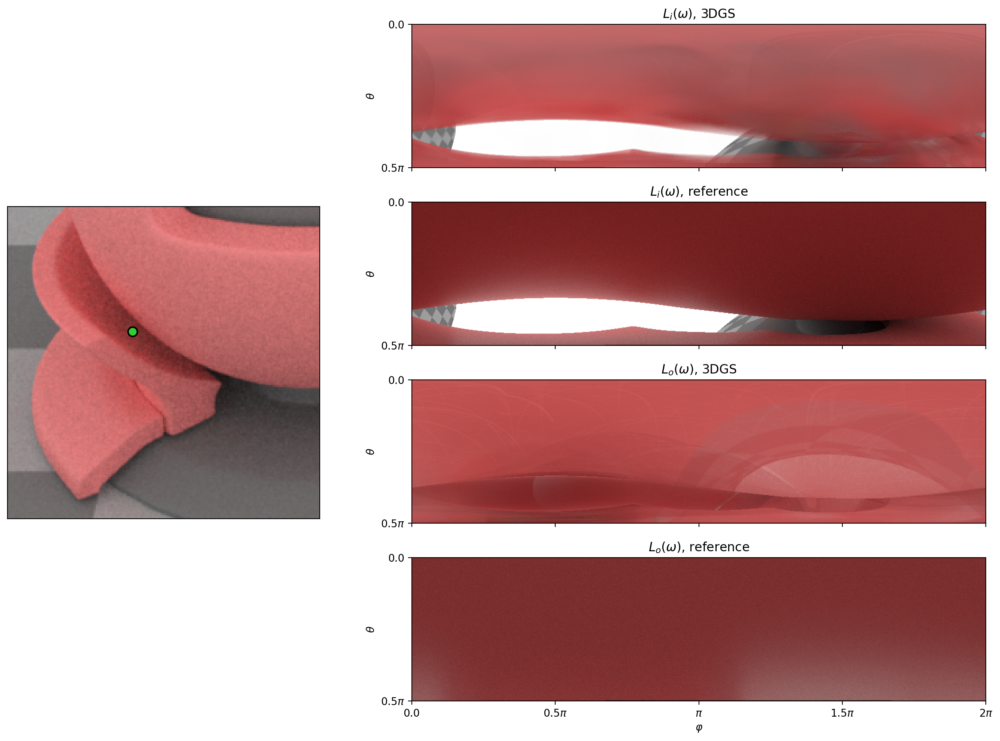

In [5]:
scene_path = "/home/jonathan/Documents/volprim-balance/scenes/mitsuba/matpreview_constant/matpreview.xml"
gs_path = "/home/jonathan/Documents/taming-3dgs/output/matpreview_constant/point_cloud/iteration_7000/point_cloud.ply"
u_px, v_px = 230, 330
# plot_Lo(*get_si(scene_path, gs_path, u_px, v_px), filename="Exp2-1_Lo_comparison")
# plot_Li(*get_si(scene_path, gs_path, u_px, v_px), filename="Exp2-1_Li_comparison")
plot_Li_Lo(*get_si(scene_path, gs_path, u_px, v_px), render_crop=[150, 350, 250, 450], filename="Exp2-1_LiLo_comparison")

# Experiment 2.2

## Floortex

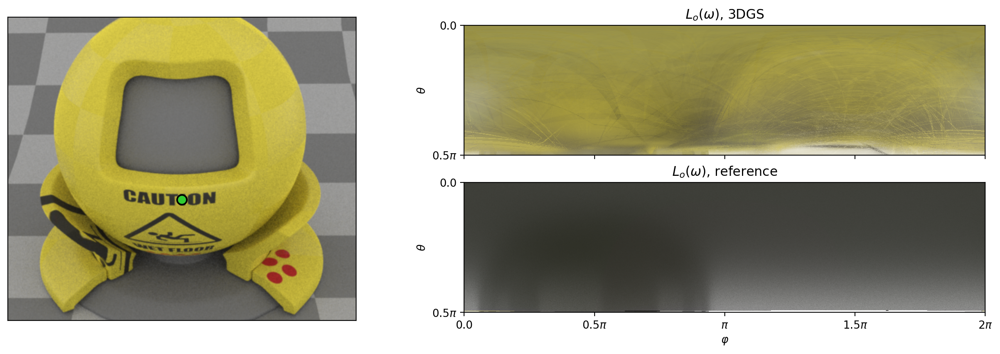

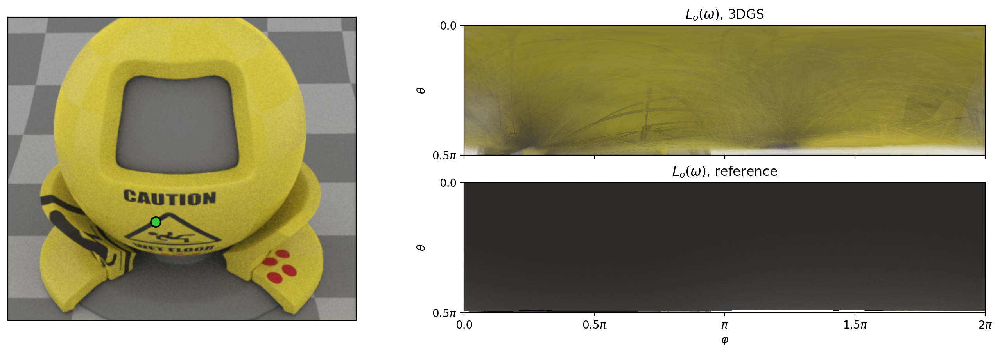

In [6]:
scene_path = "/home/jonathan/Documents/volprim-balance/scenes/mitsuba/matpreview_const_texture/matpreview.xml"
gs_path = "/home/jonathan/Documents/taming-3dgs/output/matpreview_const_texture/point_cloud/iteration_7000/point_cloud.ply"
# u_px, v_px = 230, 210   # yellow, glossy
u_px, v_px = 345, 295   # black, glossy
plot_Lo(*get_si(scene_path, gs_path, u_px, v_px), filename="Exp2-2_floortex_Lo_comparison_gloss")

u_px, v_px = 312, 323   # black, rough
plot_Lo(*get_si(scene_path, gs_path, u_px, v_px), filename="Exp2-2_floortex_Lo_comparison_rough")

## Wavetex

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.056627527..1.0546795].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0209088].


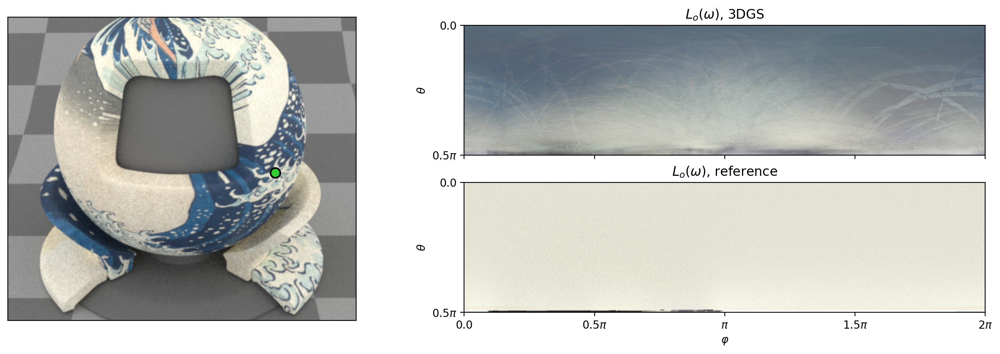

In [7]:
scene_path = "/home/jonathan/Documents/volprim-balance/scenes/mitsuba/matpreview_const_texwave/matpreview.xml"
gs_path = "/home/jonathan/Documents/taming-3dgs/output/matpreview_const_texwave/point_cloud/iteration_7000/point_cloud.ply"
u_px, v_px = 463, 261

plot_Lo(*get_si(scene_path, gs_path, u_px, v_px), filename="Exp2-2_wavetex_Lo_comparison")

# Experiment 2.3

## Museum env

In [5]:
# def plot_Li_error(si: mi.SurfaceInteraction3f, rc: RadianceCache, u_px: int, v_px: int, filename="Li_comparison"):
#     sampler = mi.load_dict({'type': 'independent'})

#     N = 256
#     img_out = rc._render_hemisphere_auto_offset(si, sampler, N)[0]
#     img_gt = render_hemisphere_rt(rc.mi_scene, si, sampler, N, spp = 256)[0]

#     # if True:
#     #     # img_out **= (1/2.2)
#     #     # img_gt **= (1/2.2)
#     #     img_out *= 0.1
#     #     img_gt  *= 0.1

#     fig = plt.figure(figsize=(14,4.5), dpi=200)
#     fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(14,8), dpi=200)
#     ax2 = axes[0]
#     ax3 = axes[1]
#     ax1 = axes[2]

#     ax2.imshow(img_out ** (1/2.2), extent=[0, dr.two_pi, 0.5 * dr.pi, 0.0])
#     ax2.set_yticks([0.0, dr.pi/2]); ax2.set_ylabel(r"$\theta$")
#     ax2.set_yticklabels([r"0.0", r"0.5$\pi$"])
#     ax2.set_xticks([0.0, dr.pi/2, dr.pi, dr.pi/2 * 3, dr.pi*2]); ax2.set_xticklabels(""); ax2.set_xlabel("")
#     ax2.set_title(r"$L_{i}(\omega)$, 3DGS")

#     ax3.imshow(img_gt ** (1/2.2), extent=[0, dr.two_pi, 0.5 * dr.pi, 0.0])
#     ax3.set_yticks([0.0, dr.pi/2]); ax3.set_ylabel(r"$\theta$")
#     ax3.set_yticklabels([r"0.0", r"0.5$\pi$"])
#     ax3.set_xticks([0.0, dr.pi/2, dr.pi, dr.pi/2 * 3, dr.pi*2]); ax3.set_xticklabels(""); ax3.set_xlabel("")
#     ax3.set_title(r"$L_{i}(\omega)$, reference")

#     img_err = img_gt - img_out
#     lum_err = (img_err[:,:,0] + img_err[:,:,1] + img_err[:,:,2]) / 3
#     # 0.2126 R + 0.7152 G + 0.0722 B
#     err_range = 3.0 # dr.max(dr.abs(lum_err), axis=None).numpy().item()

#     im = ax1.imshow(lum_err, extent=[0, dr.two_pi, 0.5 * dr.pi, 0.0], cmap='coolwarm', vmin=-err_range, vmax=err_range)
#     ax1.set_xticks([0.0, dr.pi/2, dr.pi, dr.pi/2 * 3, dr.pi*2]); ax1.set_xlabel(r"$\varphi$")
#     ax1.set_xticklabels([r"0.0", r"0.5$\pi$", r"$\pi$", r"1.5$\pi$", r"2$\pi$"])
#     ax1.set_yticks([0.0, dr.pi/2]); ax1.set_ylabel(r"$\theta$")
#     ax1.set_yticklabels([r"0.0", r"0.5$\pi$"])
#     ax1.set_title("Error")

#     # fig.subplots_adjust(right=0.8)
#     # cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
#     fig.colorbar(im, ax=axes.ravel().tolist())

#     plt.tight_layout()
#     plt.savefig(f"{filename}.png")



# scene_path = "/home/jonathan/Documents/volprim-balance/scenes/mitsuba/matpreview_museum_texfloor/matpreview.xml"
# gs_path = "/home/jonathan/Documents/taming-3dgs/output/default_museum_tex/point_cloud/iteration_7000/point_cloud.ply"
# # u_px, v_px = 230, 120
# u_px, v_px = 270, 110


# # seek(scene_path, gs_path, u_px, v_px)
# si, rc = get_si(scene_path, gs_path, u_px, v_px)[:2]
# plot_Li_error(si, rc, u_px, v_px, filename="Exp2-3_Li_env_error")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.09878498..4.5178304].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.043929].


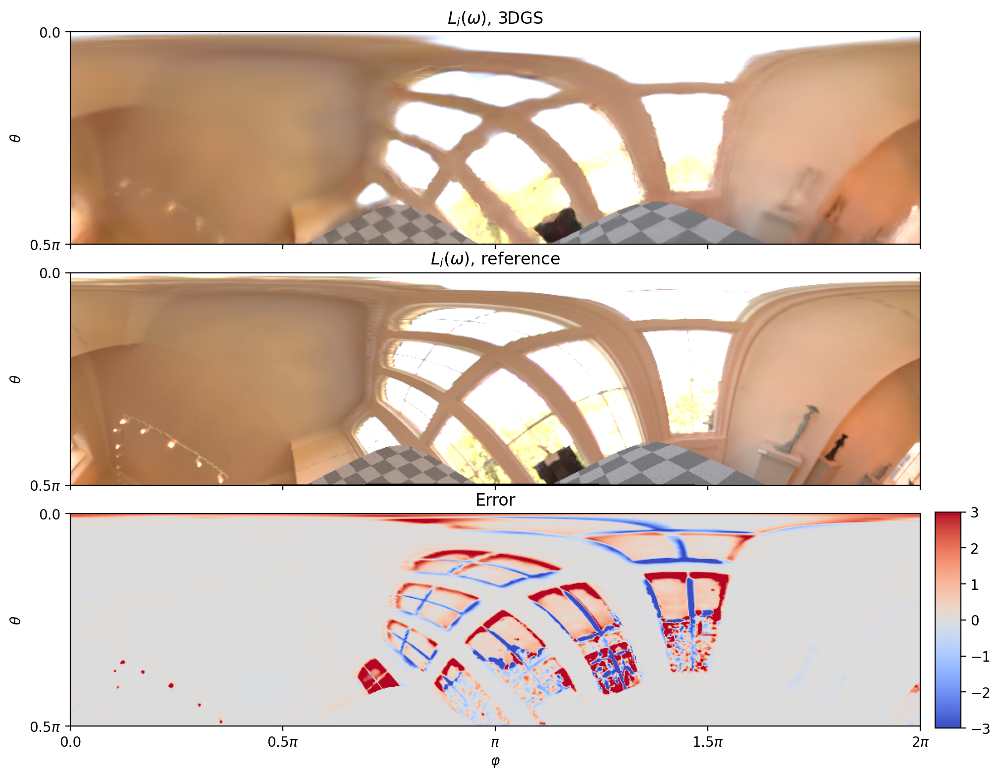

In [9]:
from mpl_toolkits.axes_grid1 import ImageGrid

def plot_Li_error(si: mi.SurfaceInteraction3f, rc: RadianceCache, u_px: int, v_px: int, filename="Li_comparison"):
    sampler = mi.load_dict({'type': 'independent'})

    N = 256
    img_out = rc._render_hemisphere_auto_offset(si, sampler, N)[0]
    img_gt = render_hemisphere_rt(rc.mi_scene, si, sampler, N, spp = 256)[0]

    fig = plt.figure(figsize=(10.2, 8), dpi=200)
    grid = ImageGrid(fig, 111,
                    nrows_ncols=(3,1),
                    axes_pad=0.25,
                    aspect=False,
                    share_all=True,
                    cbar_location="right",
                    cbar_mode="edge",
                    cbar_size="3%",
                    cbar_pad=0.15,
                    )

    ax2 = grid[0]
    ax3 = grid[1]
    ax1 = grid[2]

    ax2.imshow(img_out ** (1/2.2), extent=[0, dr.two_pi, 0.5 * dr.pi, 0.0])
    ax2.set_yticks([0.0, dr.pi/2]); ax2.set_ylabel(r"$\theta$")
    ax2.set_yticklabels([r"0.0", r"0.5$\pi$"])
    ax2.set_xticks([0.0, dr.pi/2, dr.pi, dr.pi/2 * 3, dr.pi*2]); ax2.set_xticklabels(""); ax2.set_xlabel("")
    ax2.set_title(r"$L_{i}(\omega)$, 3DGS")

    ax3.imshow(img_gt ** (1/2.2), extent=[0, dr.two_pi, 0.5 * dr.pi, 0.0])
    ax3.set_yticks([0.0, dr.pi/2]); ax3.set_ylabel(r"$\theta$")
    ax3.set_yticklabels([r"0.0", r"0.5$\pi$"])
    ax3.set_xticks([0.0, dr.pi/2, dr.pi, dr.pi/2 * 3, dr.pi*2]); ax3.set_xticklabels(""); ax3.set_xlabel("")
    ax3.set_title(r"$L_{i}(\omega)$, reference")

    img_err = img_gt - img_out
    lum_err = (img_err[:,:,0] + img_err[:,:,1] + img_err[:,:,2]) / 3
    err_range = 3.0 # dr.max(dr.abs(lum_err), axis=None).numpy().item()

    im = ax1.imshow(lum_err, extent=[0, dr.two_pi, 0.5 * dr.pi, 0.0], cmap='coolwarm', vmin=-err_range, vmax=err_range)
    ax1.set_xticks([0.0, dr.pi/2, dr.pi, dr.pi/2 * 3, dr.pi*2]); ax1.set_xlabel(r"$\varphi$")
    ax1.set_xticklabels([r"0.0", r"0.5$\pi$", r"$\pi$", r"1.5$\pi$", r"2$\pi$"])
    ax1.set_yticks([0.0, dr.pi/2]); ax1.set_ylabel(r"$\theta$")
    ax1.set_yticklabels([r"0.0", r"0.5$\pi$"])
    ax1.set_title("Error")

    # Colorbar
    ax1.cax.colorbar(im)
    grid.cbar_axes[0].remove()
    grid.cbar_axes[1].remove()
    plt.tight_layout()
    plt.savefig(f"{filename}.png")



scene_path = "/home/jonathan/Documents/volprim-balance/scenes/mitsuba/matpreview_museum_texfloor/matpreview.xml"
gs_path = "/home/jonathan/Documents/taming-3dgs/output/default_museum_tex/point_cloud/iteration_7000/point_cloud.ply"
# u_px, v_px = 230, 120
u_px, v_px = 270, 110

plot_Li_error(*get_si(scene_path, gs_path, u_px, v_px), filename="Exp2-3_Li_env_error")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04896696..1.6709813].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.23019123..3.4186237].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..3.8457165].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04896696..1.6709813].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.3064825..3.8939962].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.6714252].


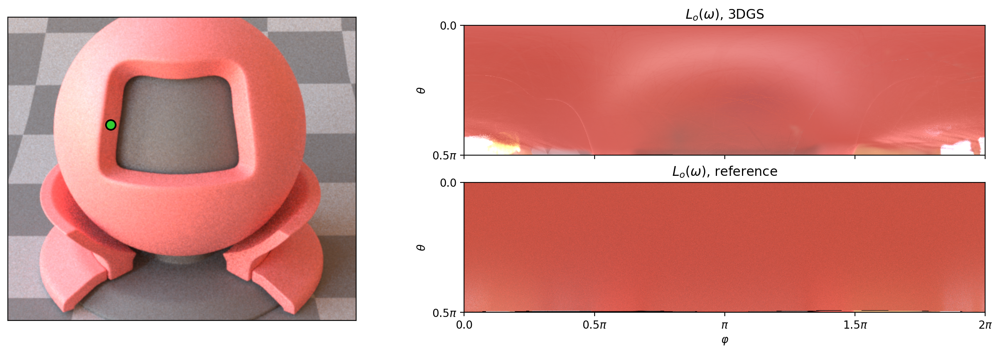

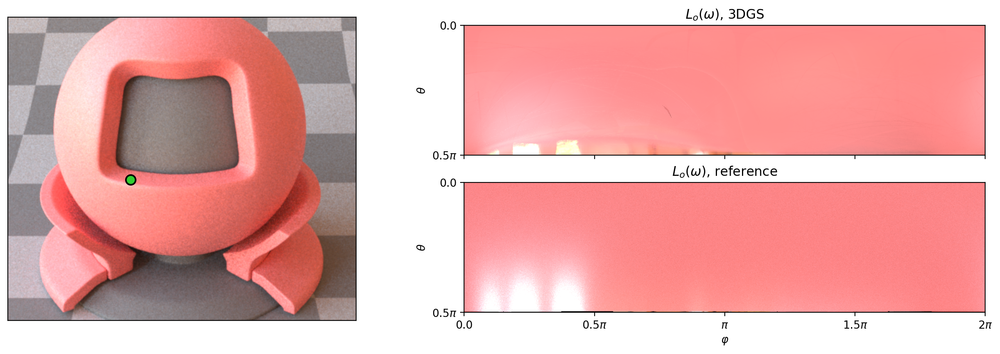

In [6]:
scene_path = "/home/jonathan/Documents/volprim-balance/scenes/mitsuba/matpreview_default/matpreview.xml"
gs_path = "/home/jonathan/Documents/taming-3dgs/output/matpreview_default/point_cloud/iteration_7000/point_cloud.ply"

u_px, v_px = 255, 200
plot_Lo(*get_si(scene_path, gs_path, u_px, v_px), "Exp2-3_Lo_opacity1")

u_px, v_px = 280, 270   # missing specular
plot_Lo(*get_si(scene_path, gs_path, u_px, v_px), "Exp2-3_Lo_opacity2")


# u_px, v_px = 215, 200 # left-outie, Li 5%, Lo no specular (too low)
# # u_px, v_px = 255, 200 # left-innie, Li 3.9%, Lo peek (too high)
# # u_px, v_px = 420, 200 # right-innie, Li 6.5%, Lo too low
# # u_px, v_px = 470, 200 # right-outie, Li 11%, Lo peek + no specular
# # plot_Li(*get_si(scene_path, gs_path, u_px, v_px))
# plot_Li_Lo(*get_si(scene_path, gs_path, u_px, v_px))